<a href="https://colab.research.google.com/github/laviniadipanfilo/Contendipity/blob/main/AI0.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [2]:
import os
import zipfile
import shutil
import random
import io
import cv2
import torch
import torch.nn as nn
import torch.optim as optim
from torchvision import datasets, transforms, models
from torch.utils.data import DataLoader, Subset
from google.colab import files
from PIL import Image
import numpy as np
import matplotlib.pyplot as plt
from IPython.display import HTML, display
from base64 import b64encode

# =====================================================================
# 0. DETERMINISMO E CONFIGURAZIONE DI BASE
# =====================================================================
def set_seed(seed=42):
    random.seed(seed)
    os.environ['PYTHONHASHSEED'] = str(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)
    torch.cuda.manual_seed(seed)
    torch.cuda.manual_seed_all(seed)
    torch.backends.cudnn.deterministic = True
    torch.backends.cudnn.benchmark = False

set_seed(42)
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Seed impostato. Dispositivo in uso: {device}")

# =====================================================================
# 1. CARICAMENTO E PULIZIA DEL DATASET DI ADDESTRAMENTO
# =====================================================================
print("\n--- FASE 1: Caricamento del dataset per il Classificatore ---")
uploaded = files.upload()
if not uploaded:
    print("Errore: Carica il dataset.zip per procedere!")
    raise SystemExit

zip_name = list(uploaded.keys())[0]
with zipfile.ZipFile(zip_name, 'r') as zip_ref:
    zip_ref.extractall('dataset_training')
print("Estrazione completata!")

macosx_path = 'dataset_training/__MACOSX'
if os.path.exists(macosx_path):
    shutil.rmtree(macosx_path)

for root, dirs, files_list in os.walk('dataset_training'):
    for file in files_list:
        if file.startswith('._'):
            os.remove(os.path.join(root, file))
print("Pulizia file nascosti completata.\n")

# =====================================================================
# 2. PREPARAZIONE DATI (SPLIT TRAIN/VAL)
# =====================================================================
print("--- FASE 2: Configurazione dei Dataset ---")

train_transforms = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.RandomHorizontalFlip(),
    transforms.RandomVerticalFlip(p=0.2),
    transforms.RandomRotation(20),
    transforms.RandomAffine(degrees=0, translate=(0.1, 0.1), scale=(0.9, 1.1)),
    transforms.RandomApply([
        transforms.ColorJitter(brightness=0.2, contrast=0.2, saturation=0.15)
    ], p=0.6),
    transforms.RandomApply([
        transforms.GaussianBlur(kernel_size=(3, 3), sigma=(0.1, 1.5))
    ], p=0.3),
    transforms.ToTensor(),
    transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
])

val_transforms = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
])

# Configurato coerentemente su 'dataset_training'
base_path = 'dataset_training'
if len(os.listdir(base_path)) == 1 and os.path.isdir(os.path.join(base_path, os.listdir(base_path)[0])):
    base_path = os.path.join(base_path, os.listdir(base_path)[0])

full_dataset_train = datasets.ImageFolder(root=base_path, transform=train_transforms)
full_dataset_val = datasets.ImageFolder(root=base_path, transform=val_transforms)
class_names = full_dataset_train.classes
print(f"Classi rilevate per il riconoscimento: {class_names}")

num_samples = len(full_dataset_train)
indices = list(range(num_samples))
np.random.shuffle(indices)
split = int(np.floor(0.2 * num_samples))
train_idx, val_idx = indices[split:], indices[:split]

train_dataset = Subset(full_dataset_train, train_idx)
val_dataset = Subset(full_dataset_val, val_idx)

BATCH_SIZE = 8
g = torch.Generator().manual_seed(42)
train_loader = DataLoader(train_dataset, batch_size=BATCH_SIZE, shuffle=True, generator=g)
val_loader = DataLoader(val_dataset, batch_size=BATCH_SIZE, shuffle=False)

# =====================================================================
# 3. ARCHITETTURA RESNET50 & ADDESTRAMENTO
# =====================================================================
print("\n--- FASE 3: Inizializzazione e Addestramento del Modello ---")
model = models.resnet50(weights=models.ResNet50_Weights.DEFAULT)

for param in model.parameters():
    param.requires_grad = False

for param in model.layer3.parameters():
    param.requires_grad = True
for param in model.layer4.parameters():
    param.requires_grad = True

num_ftrs = model.fc.in_features
model.fc = nn.Sequential(
    nn.Linear(num_ftrs, 64),
    nn.ReLU(),
    nn.Dropout(0.5),
    nn.Linear(64, len(class_names))
)
model = model.to(device)

optimizer = optim.Adam([
    {'params': model.layer3.parameters(), 'lr': 1e-6, 'weight_decay': 1e-4},
    {'params': model.layer4.parameters(), 'lr': 1e-5, 'weight_decay': 1e-4},
    {'params': model.fc.parameters(), 'lr': 3e-4}
])
criterion = nn.CrossEntropyLoss()

epochs = 20
for epoch in range(epochs):
    model.train()
    train_loss, train_corrects = 0.0, 0
    for inputs, labels in train_loader:
        inputs, labels = inputs.to(device), labels.to(device)
        optimizer.zero_grad()
        outputs = model(inputs)
        loss = criterion(outputs, labels)
        _, preds = torch.max(outputs, 1)
        loss.backward()
        optimizer.step()
        train_loss += loss.item() * inputs.size(0)
        train_corrects += torch.sum(preds == labels.data)

    epoch_train_loss = train_loss / len(train_dataset)
    epoch_train_acc = train_corrects.double() / len(train_dataset)

    model.eval()
    val_loss, val_corrects = 0.0, 0
    with torch.no_grad():
        for inputs, labels in val_loader:
            inputs, labels = inputs.to(device), labels.to(device)
            outputs = model(inputs)
            loss = criterion(outputs, labels)
            _, preds = torch.max(outputs, 1)
            val_loss += loss.item() * inputs.size(0)
            val_corrects += torch.sum(preds == labels.data)

    epoch_val_loss = val_loss / len(val_dataset)
    epoch_val_acc = val_corrects.double() / len(val_dataset)

    print(f"Epoca {epoch+1:02d}/{epochs} -> Loss Tr: {epoch_train_loss:.3f} | Acc Tr: {epoch_train_acc:.3f} || Loss Val: {epoch_val_loss:.3f} | Acc Val: {epoch_val_acc:.3f}")

print("\nAddestramento della Rete Neurale completato con successo!")


def esegui_classificazione_resnet():
    print("MODALITÀ: CLASSIFICAZIONE / RICONOSCIMENTO STILE")
    print("Seleziona una o più foto da far analizzare alla ResNet50:")

    test_transforms = transforms.Compose([
        transforms.Resize((224, 224)),
        transforms.ToTensor(),
        transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
    ])

    uploaded_images = files.upload()
    if not uploaded_images:
        print("Nessuna immagine caricata.")
        return

    model.eval()
    for img_name, img_data in uploaded_images.items():
        try:
            img_pil = Image.open(io.BytesIO(img_data)).convert('RGB')
        except:
            print(f"Saltato file non valido: {img_name}")
            continue

        input_tensor = test_transforms(img_pil).unsqueeze(0).to(device)

        with torch.no_grad():
            outputs = model(input_tensor)
            predizioni = torch.nn.functional.softmax(outputs, dim=1)[0].cpu().numpy()

        corrente_scelta_idx = np.argmax(predizioni)
        confidenza = predizioni[corrente_scelta_idx] * 100

        print("\n" + "="*50)
        print(f"FILE ANALIZZATO: {img_name}")
        print(f"STILE RILEVATO: {class_names[corrente_scelta_idx].upper()} ({confidenza:.2f}%)")
        print("="*50)

        fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 4))
        ax1.imshow(np.array(img_pil))
        ax1.set_title(f"Quadro: {img_name}\nPred: {class_names[corrente_scelta_idx]}", fontsize=10, fontweight='bold')
        ax1.axis('off')

        colors = ['#7f7f7f'] * len(class_names)
        colors[corrente_scelta_idx] = '#2B579A'

        barre = ax2.barh(class_names, predizioni * 100, color=colors, edgecolor='black')
        ax2.set_xlabel('Confidenza Softmax (%)')
        ax2.set_xlim(0, 100)
        ax2.grid(axis='x', linestyle='--', alpha=0.5)

        for barra in barre:
            width = barra.get_width()
            ax2.text(width + 1.5, barra.get_y() + barra.get_height()/2, f'{width:.1f}%',
                     va='center', ha='left', fontsize=9, fontweight='bold')

        plt.tight_layout()
        plt.show()

Seed impostato. Dispositivo in uso: cuda

--- FASE 1: Caricamento del dataset per il Classificatore ---


Saving dataset_training.zip to dataset_training (5).zip
Estrazione completata!
Pulizia file nascosti completata.

--- FASE 2: Configurazione dei Dataset ---
Classi rilevate per il riconoscimento: ['Astrattismo', 'Impressionismo', 'Pop_Art', 'Rinascimento']

--- FASE 3: Inizializzazione e Addestramento del Modello ---
Downloading: "https://download.pytorch.org/models/resnet50-11ad3fa6.pth" to /root/.cache/torch/hub/checkpoints/resnet50-11ad3fa6.pth


100%|██████████| 97.8M/97.8M [00:00<00:00, 173MB/s]


Epoca 01/20 -> Loss Tr: 1.371 | Acc Tr: 0.281 || Loss Val: 1.344 | Acc Val: 0.438
Epoca 02/20 -> Loss Tr: 1.308 | Acc Tr: 0.484 || Loss Val: 1.303 | Acc Val: 0.312
Epoca 03/20 -> Loss Tr: 1.210 | Acc Tr: 0.609 || Loss Val: 1.240 | Acc Val: 0.438
Epoca 04/20 -> Loss Tr: 1.155 | Acc Tr: 0.609 || Loss Val: 1.192 | Acc Val: 0.500
Epoca 05/20 -> Loss Tr: 1.066 | Acc Tr: 0.672 || Loss Val: 1.123 | Acc Val: 0.625
Epoca 06/20 -> Loss Tr: 1.008 | Acc Tr: 0.703 || Loss Val: 1.034 | Acc Val: 0.625
Epoca 07/20 -> Loss Tr: 0.885 | Acc Tr: 0.766 || Loss Val: 0.939 | Acc Val: 0.625
Epoca 08/20 -> Loss Tr: 0.881 | Acc Tr: 0.734 || Loss Val: 0.889 | Acc Val: 0.625
Epoca 09/20 -> Loss Tr: 0.753 | Acc Tr: 0.844 || Loss Val: 0.855 | Acc Val: 0.625
Epoca 10/20 -> Loss Tr: 0.673 | Acc Tr: 0.859 || Loss Val: 0.774 | Acc Val: 0.625
Epoca 11/20 -> Loss Tr: 0.652 | Acc Tr: 0.812 || Loss Val: 0.723 | Acc Val: 0.625
Epoca 12/20 -> Loss Tr: 0.627 | Acc Tr: 0.828 || Loss Val: 0.701 | Acc Val: 0.750
Epoca 13/20 -> L

In [ ]:
!pip install diffusers transformers accelerate -q

In [4]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import os
import torch
from google.colab import files
from PIL import Image
from IPython.display import HTML, display
from base64 import b64encode
from diffusers import StableDiffusionImg2ImgPipeline

def esegui_pittura_pso():
    # ==========================================
    # 1. CARICAMENTO E PREPARAZIONE
    # ==========================================
    uploaded = files.upload()
    if not uploaded:
        print("Errore: Carica un'immagine!")
        return

    nome_file = list(uploaded.keys())[0]
    nparr = np.frombuffer(uploaded[nome_file], np.uint8)
    img_bgr = cv2.imdecode(nparr, cv2.IMREAD_COLOR)
    img_rgb = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)

    img_rgb = cv2.resize(img_rgb, (800, 600))
    h, w, _ = img_rgb.shape

    hsv = cv2.cvtColor(img_rgb, cv2.COLOR_RGB2HSV).astype(np.float32)
    hsv[:, :, 1] *= 1.6
    img_vivid = cv2.cvtColor(np.clip(hsv, 0, 255).astype(np.uint8), cv2.COLOR_HSV2RGB)

    gray = cv2.cvtColor(img_rgb, cv2.COLOR_RGB2GRAY)
    detail_map = cv2.normalize(np.abs(cv2.Laplacian(gray, cv2.CV_64F)), None, 0, 1, cv2.NORM_MINMAX)

    # ==========================================
    # 2. PARAMETRI PSO (ORIGINALI AL 100%)
    # ==========================================
    num_particles = 20000
    iterations = 350
    w_inertia = 0.9
    c1, c2 = 0.06, 0.04

    pos = np.stack((np.random.uniform(0, w-1, num_particles),
                    np.random.uniform(0, h-1, num_particles)), axis=-1)
    vel = np.random.uniform(-2, 2, (num_particles, 2))

    pbest = pos.copy()
    pbest_score = np.zeros(num_particles)

    # Canvas originale bianco puro
    canvas = np.full((h, w, 3), 255, dtype=np.uint8)

    temp_video = "nascita_poetica.mp4"
    fps = 30
    video = cv2.VideoWriter(temp_video, cv2.VideoWriter_fourcc(*'MP4V'), fps, (w, h))

    print("Creazione in corso...")

    # ==========================================
    # 3. LOOP DI PITTURA (ORIGINALE AL 100%)
    # ==========================================
    for i in range(iterations):
        progress = i / iterations
        old_pos = pos.copy()

        r1, r2 = np.random.rand(num_particles, 2), np.random.rand(num_particles, 2)
        noise = np.random.randn(num_particles, 2) * 0.8

        gbest = pbest[np.argmax(pbest_score)]
        current_c2 = c2 * progress

        vel = w_inertia * vel + noise + c1 * r1 * (pbest - pos) + current_c2 * r2 * (gbest - pos)
        pos += np.clip(vel, -5, 5)
        pos[:, 0] = np.clip(pos[:, 0], 0, w-1)
        pos[:, 1] = np.clip(pos[:, 1], 0, h-1)

        ix_fit, iy_fit = pos[:, 0].astype(int), pos[:, 1].astype(int)
        blank_weight = 0.8 * (1 - progress) + 0.2
        detail_weight = 0.2 * progress + 0.1

        canvas_check = np.all(canvas[iy_fit, ix_fit] == 255, axis=-1).astype(float)
        scores = detail_map[iy_fit, ix_fit] * detail_weight + canvas_check * blank_weight

        better_mask = scores > pbest_score
        pbest_score[better_mask] = scores[better_mask]
        pbest[better_mask] = pos[better_mask]

        overlay = canvas.copy()
        ix, iy = pos[:, 0].astype(int), pos[:, 1].astype(int)

        for p in range(num_particles):
            if np.random.rand() > (0.02 + progress * 0.4): continue
            color = img_vivid[iy[p], ix[p]].astype(float)
            color = np.clip(color + np.random.uniform(-8, 8, 3), 0, 255).astype(int).tolist()

            if detail_map[iy[p], ix[p]] < 0.2:
                thick = np.random.randint(3, 6) if progress < 0.3 else (np.random.randint(1, 3))
            else:
                thick = 1
            cv2.line(overlay, tuple(old_pos[p].astype(int)), (ix[p], iy[p]), color, thick)

        alpha = 0.1 + (progress * 0.4)
        cv2.addWeighted(overlay, alpha, canvas, 1 - alpha, 0, canvas)
        video.write(cv2.cvtColor(canvas, cv2.COLOR_RGB2BGR))

        if i % 70 == 0: print(f"Avanzamento: {int(progress*100)}%")

    # Salvataggio Video finale
    final_res_bgr = cv2.cvtColor(canvas, cv2.COLOR_RGB2BGR)
    for _ in range(fps * 3): video.write(final_res_bgr)
    video.release()

    # ==========================================
    # 4. GENERAZIONE FOTO FINALE PSO
    # ==========================================
    foto_finale = "opera_completata.png"
    cv2.imwrite(foto_finale, final_res_bgr)

    print("\n--- OPERA COMPLETATA ---")
    plt.figure(figsize=(10, 8))
    plt.imshow(canvas)
    plt.title("Foto Finale PSO (Sgranata)")
    plt.axis('off')
    plt.show()

    output_video = "nascita_poetica_finale.mp4"
    os.system(f"ffmpeg -i {temp_video} -vcodec libx264 -y {output_video} -loglevel quiet")

    mp4 = open(output_video,'rb').read()
    data_url = "data:video/mp4;base64," + b64encode(mp4).decode()
    display(HTML(f'<h3>Video del processo:</h3><video width="750" controls autoplay><source src="{data_url}" type="video/mp4"></video>'))

    # ==========================================
    # 5. REFINEMENT CON DIFFUSION MODEL (Img2Img AUTOMATICO)
    # ==========================================
    print("\n--- INIZIO REFINEMENT CON DIFFUSION MODEL (RICOSTRUZIONE AUTOMATICA) ---")

    model_id = "runwayml/stable-diffusion-v1-5"
    print("Caricamento del modello in corso...")
    pipe = StableDiffusionImg2ImgPipeline.from_pretrained(
        model_id,
        torch_dtype=torch.float16
    ).to("cuda")

    pso_image_input = Image.fromarray(canvas)

    PROMPT = "A crisp high-resolution 8k professional studio photograph, real life textures, smooth uniform surfaces, perfectly sharp focus, ultra detailed shapes, clean composition, hyper-realistic physics"
    NEGATIVE_PROMPT = "grainy texture, dots, noise, rough points, blurry, brushstrokes, oil painting, watercolor, sketch, canvas texture, impressionism, pointillism, dabs, spots, abstract artifacts, deformed"

    STRENGTH = 0.38
    GUIDANCE_SCALE = 8.5

    print(f"Applicazione Denoising Fotografico Strutturale (Strength: {STRENGTH})...")
    with torch.inference_mode():
        outputs = pipe(
            prompt=PROMPT,
            negative_prompt=NEGATIVE_PROMPT,
            image=pso_image_input,
            strength=STRENGTH,
            guidance_scale=GUIDANCE_SCALE,
            num_inference_steps=40
        )

    diffusion_result = outputs.images[0]
    foto_diffusion = "opera_pso_diffusion.png"
    diffusion_result.save(foto_diffusion)

    print("\n--- PROCESSO COMPLETATO ---")

    # Visualizzazione Finale a confronto netto
    fig, axes = plt.subplots(1, 2, figsize=(16, 8))
    axes[0].imshow(canvas)
    axes[0].set_title("1. Output PSO Originale (Sgranato)")
    axes[0].axis('off')

    axes[1].imshow(diffusion_result)
    axes[1].set_title("2. Output Finale (Immagine Nitida e Definita)")
    axes[1].axis('off')
    plt.show()

Flax classes are deprecated and will be removed in Diffusers v1.0.0. We recommend migrating to PyTorch classes or pinning your version of Diffusers.
Flax classes are deprecated and will be removed in Diffusers v1.0.0. We recommend migrating to PyTorch classes or pinning your version of Diffusers.



════════════════════════════════════════════════════════════
 MENU DI CONTROLLO AI ARTE - SCEGLI COSA FARE
════════════════════════════════════════════════════════════
 [1] MODALITÀ GENERAZIONE ARTISTICA (Algoritmo PSO Swarm + Diffusion)
 [2] MODALITÀ CLASSIFICAZIONE STILE (Rete ResNet50 Addestrata)
 [3] ESCI DAL PROGRAMMA
════════════════════════════════════════════════════════════
Digita il numero dell'opzione desiderata (1, 2 o 3): 1


Saving uomosullaluna.png to uomosullaluna (1).png
Creazione in corso...
Avanzamento: 0%
Avanzamento: 20%
Avanzamento: 40%
Avanzamento: 60%
Avanzamento: 80%

--- OPERA COMPLETATA ---


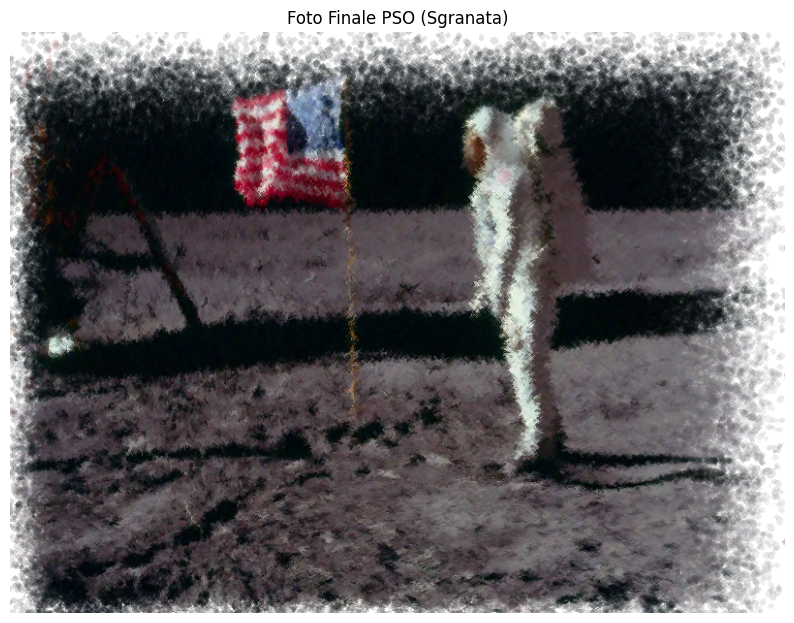


--- INIZIO REFINEMENT CON DIFFUSION MODEL (RICOSTRUZIONE AUTOMATICA) ---
Caricamento del modello in corso...


/usr/local/lib/python3.12/dist-packages/huggingface_hub/utils/_auth.py:112: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

Loading weights:   0%|          | 0/196 [00:00<?, ?it/s]

Loading weights:   0%|          | 0/396 [00:00<?, ?it/s]

Applicazione Denoising Fotografico Strutturale (Strength: 0.38)...


  0%|          | 0/15 [00:00<?, ?it/s]


--- PROCESSO COMPLETATO ---


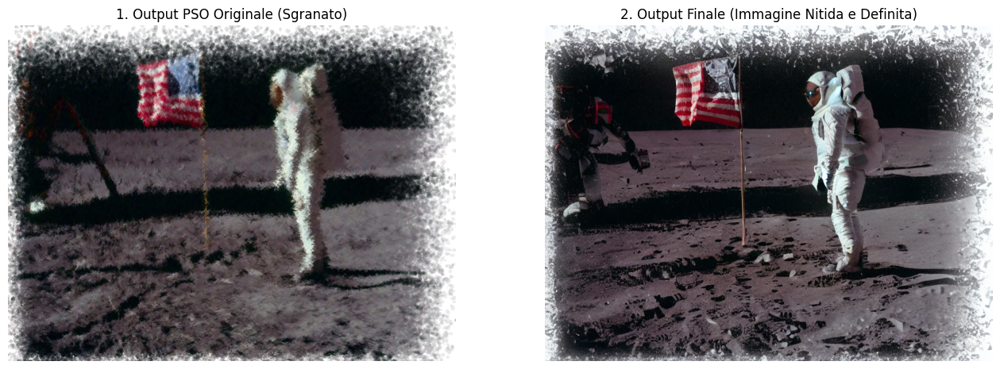


════════════════════════════════════════════════════════════
 MENU DI CONTROLLO AI ARTE - SCEGLI COSA FARE
════════════════════════════════════════════════════════════
 [1] MODALITÀ GENERAZIONE ARTISTICA (Algoritmo PSO Swarm + Diffusion)
 [2] MODALITÀ CLASSIFICAZIONE STILE (Rete ResNet50 Addestrata)
 [3] ESCI DAL PROGRAMMA
════════════════════════════════════════════════════════════
Digita il numero dell'opzione desiderata (1, 2 o 3): 2
MODALITÀ: CLASSIFICAZIONE / RICONOSCIMENTO STILE
Seleziona una o più foto da far analizzare alla ResNet50:


Saving 1000_F_267820037_F4xg35aMTG4q7t2z7HK96FexASph7VSC.jpg to 1000_F_267820037_F4xg35aMTG4q7t2z7HK96FexASph7VSC (1).jpg
Saving 30517.jpg to 30517 (1).jpg
Saving andy-micket_22965c3ab2.webp to andy-micket_22965c3ab2 (1).webp
Saving astrattismo-floreale-cubista.jpg to astrattismo-floreale-cubista (1).jpg
Saving Camille-Pissarro-Il-bagno-dei-piedi-olio-su-tela-cm.-80-x-63.jpg to Camille-Pissarro-Il-bagno-dei-piedi-olio-su-tela-cm.-80-x-63 (1).jpg
Saving composition-c-784x768.jpg to composition-c-784x768 (1).jpg
Saving DI-MASSA-LAstratitismo-ARTE-scaled.jpg to DI-MASSA-LAstratitismo-ARTE-scaled (1).jpg
Saving f_100-x-100-cm-sophie-costa-100x100-no-name-10039-42-20250903-2-230093-0.jpg to f_100-x-100-cm-sophie-costa-100x100-no-name-10039-42-20250903-2-230093-0 (1).jpg
Saving flora-sulla-sabbia.webp to flora-sulla-sabbia (1).webp
Saving giacomo-balla-pn63l417jidu7059haiytoyarzstti6lkjrmysc2h4.webp to giacomo-balla-pn63l417jidu7059haiytoyarzstti6lkjrmysc2h4 (1).webp
Saving Ideal_City_(detai

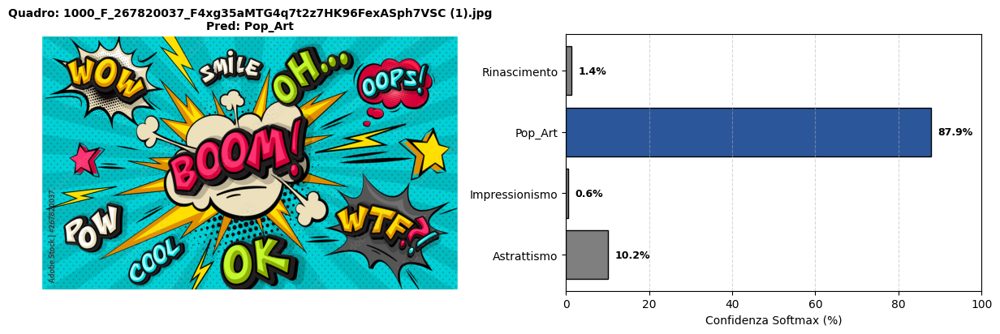


FILE ANALIZZATO: 30517 (1).jpg
STILE RILEVATO: POP_ART (90.12%)


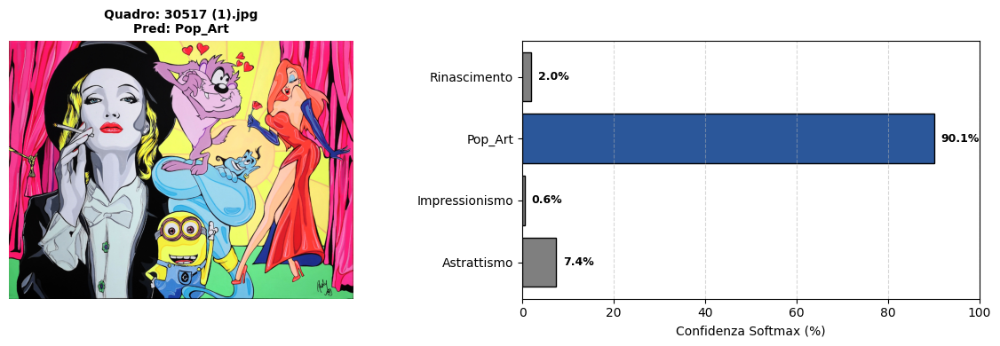


FILE ANALIZZATO: andy-micket_22965c3ab2 (1).webp
STILE RILEVATO: POP_ART (78.03%)


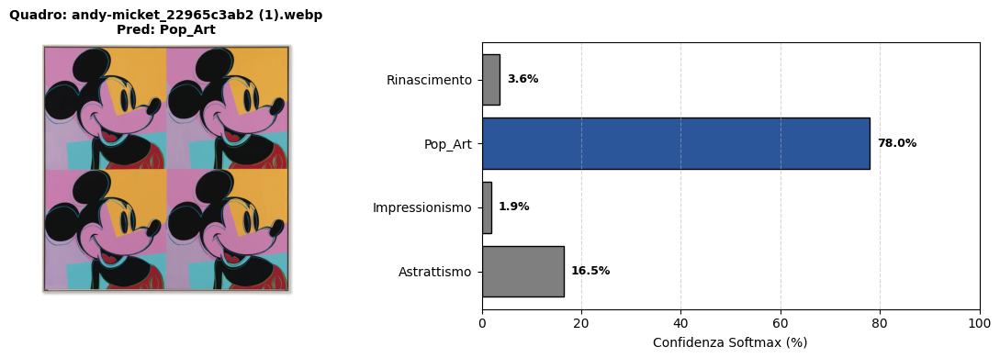


FILE ANALIZZATO: astrattismo-floreale-cubista (1).jpg
STILE RILEVATO: ASTRATTISMO (48.86%)


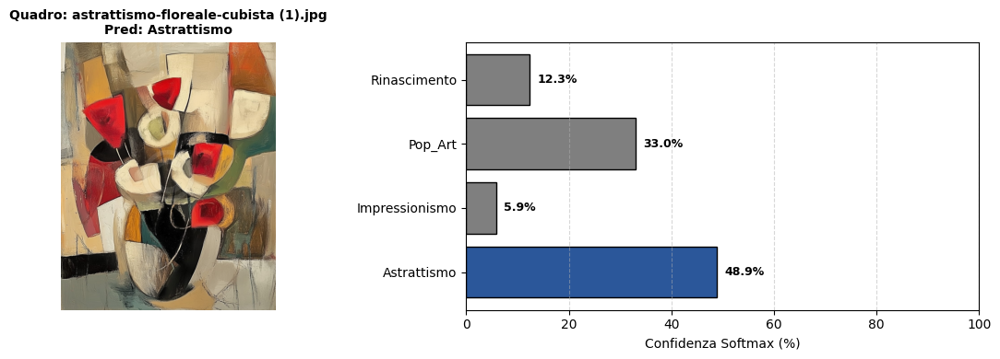


FILE ANALIZZATO: Camille-Pissarro-Il-bagno-dei-piedi-olio-su-tela-cm.-80-x-63 (1).jpg
STILE RILEVATO: IMPRESSIONISMO (58.76%)


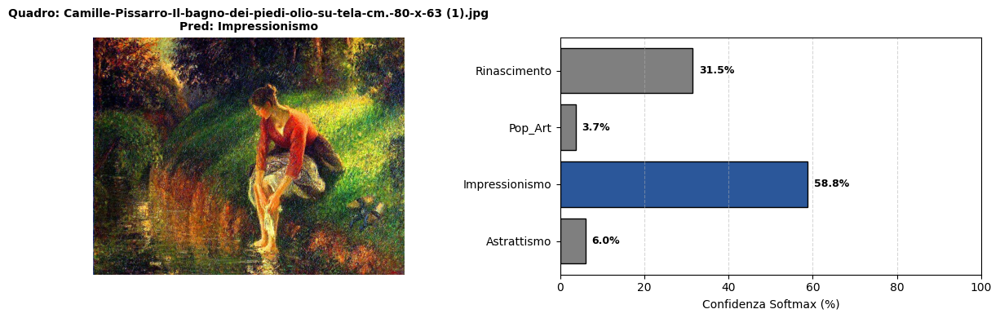


FILE ANALIZZATO: composition-c-784x768 (1).jpg
STILE RILEVATO: ASTRATTISMO (58.09%)


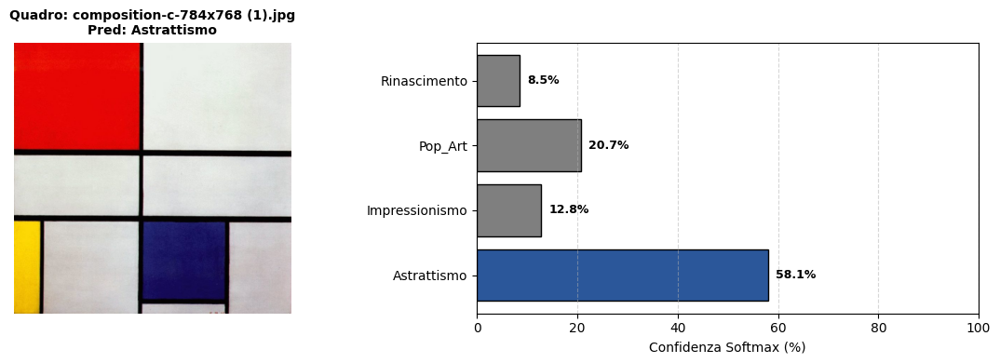


FILE ANALIZZATO: DI-MASSA-LAstratitismo-ARTE-scaled (1).jpg
STILE RILEVATO: ASTRATTISMO (45.06%)


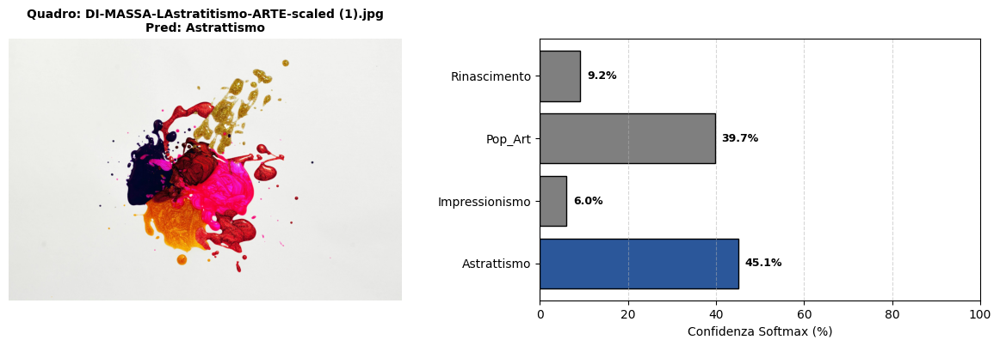


FILE ANALIZZATO: f_100-x-100-cm-sophie-costa-100x100-no-name-10039-42-20250903-2-230093-0 (1).jpg
STILE RILEVATO: POP_ART (68.06%)


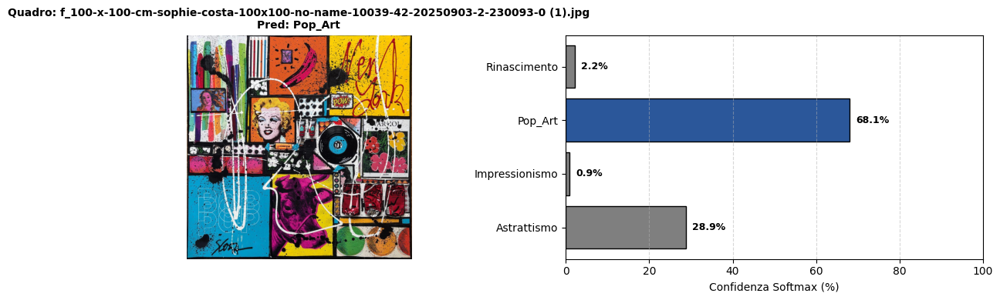


FILE ANALIZZATO: flora-sulla-sabbia (1).webp
STILE RILEVATO: ASTRATTISMO (63.97%)


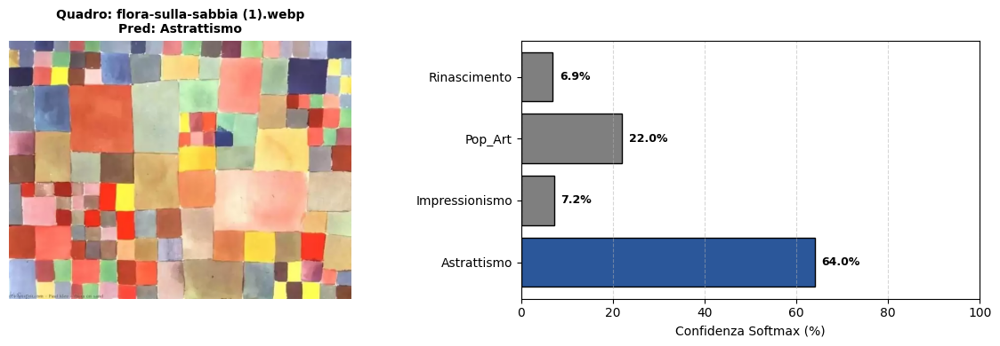


FILE ANALIZZATO: giacomo-balla-pn63l417jidu7059haiytoyarzstti6lkjrmysc2h4 (1).webp
STILE RILEVATO: ASTRATTISMO (65.31%)


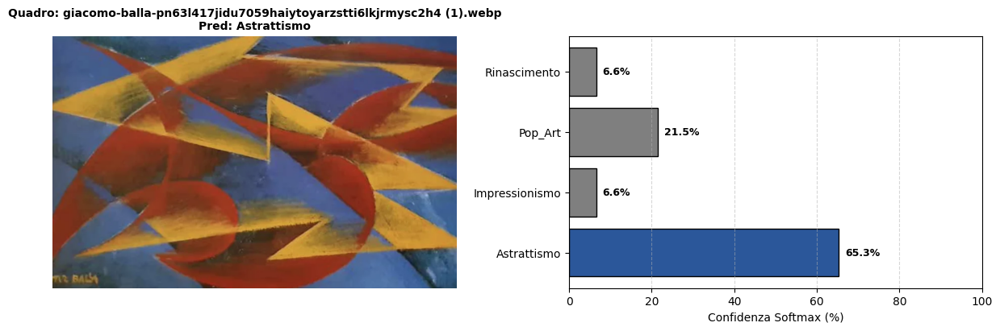


FILE ANALIZZATO: Ideal_City_(detail) (1).jpg
STILE RILEVATO: RINASCIMENTO (33.87%)


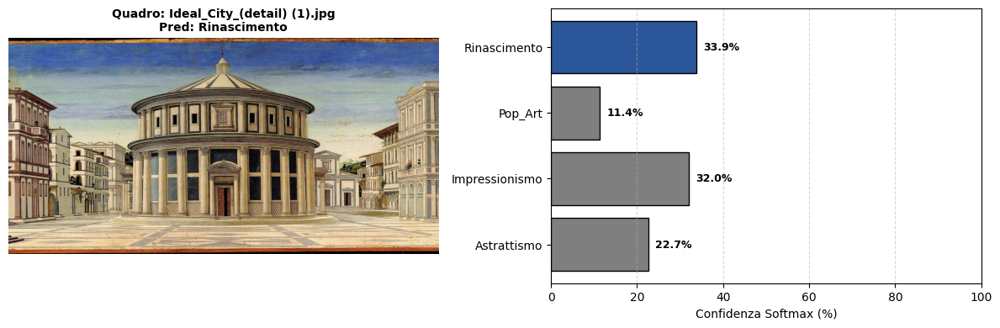


FILE ANALIZZATO: images (1).jpeg
STILE RILEVATO: IMPRESSIONISMO (69.18%)


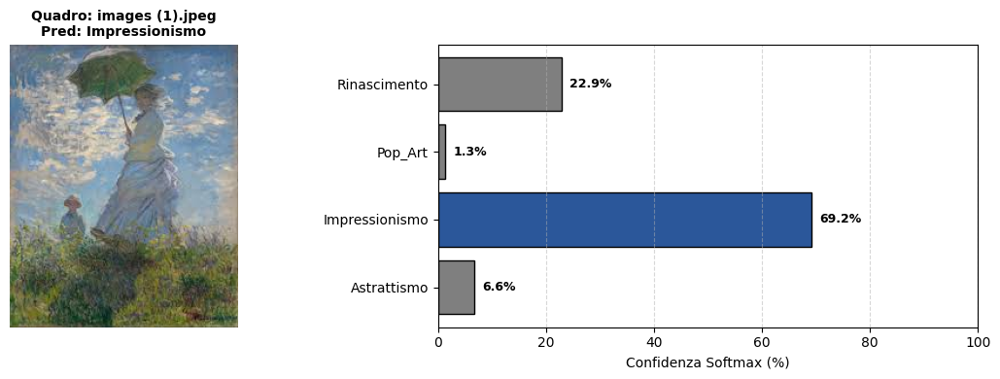


FILE ANALIZZATO: impressionismoquadro (1).png
STILE RILEVATO: RINASCIMENTO (69.23%)


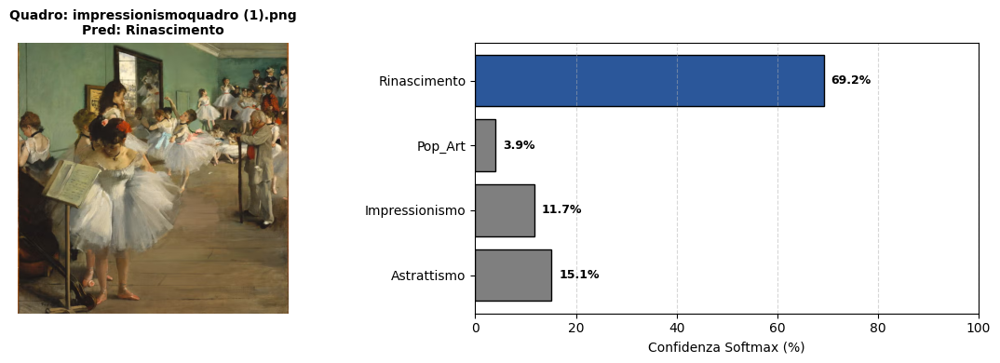


FILE ANALIZZATO: jan_van_eyck_preview (1).jpg
STILE RILEVATO: RINASCIMENTO (68.04%)


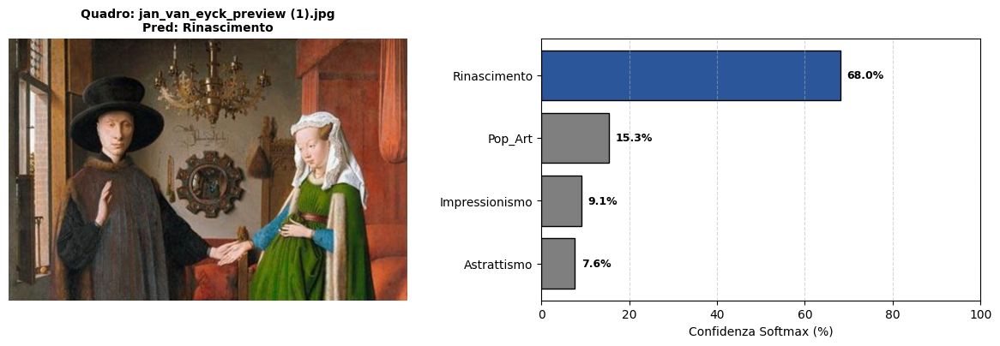


FILE ANALIZZATO: rin8 (1).png
STILE RILEVATO: RINASCIMENTO (84.76%)


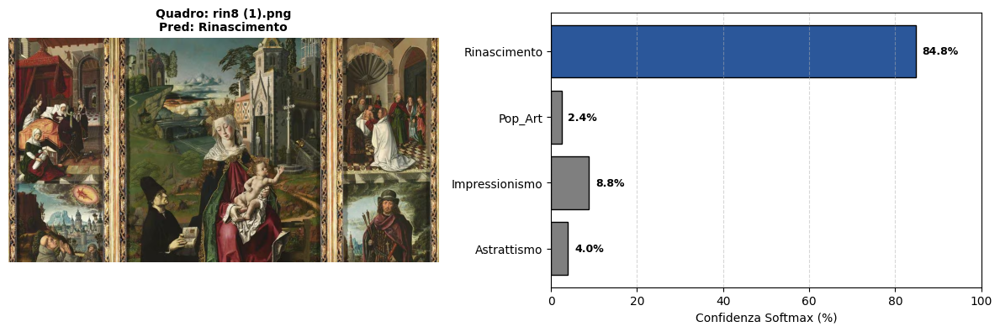


FILE ANALIZZATO: the-boulevard-montmartre-on-a-winter-morning-1658486380 (1).avif
STILE RILEVATO: IMPRESSIONISMO (57.20%)


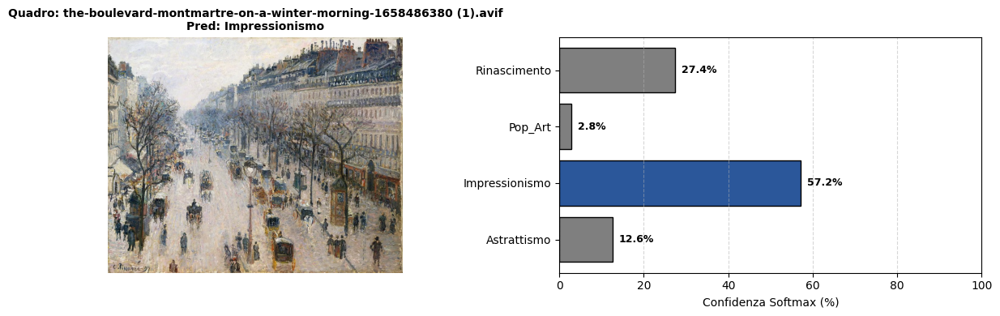


FILE ANALIZZATO: the-marriage-of-the-virgin-1504-found-in-the-collection-of-news-photo-1649226633 (1).avif
STILE RILEVATO: RINASCIMENTO (82.53%)


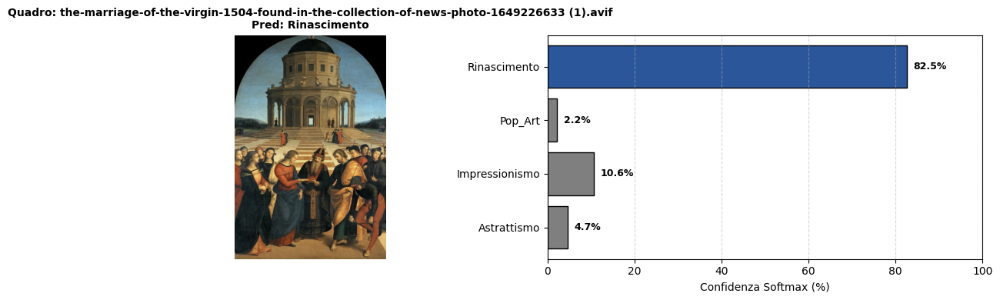


FILE ANALIZZATO: umanesimo-rinascimento-filosofia (1).jpg
STILE RILEVATO: RINASCIMENTO (78.87%)


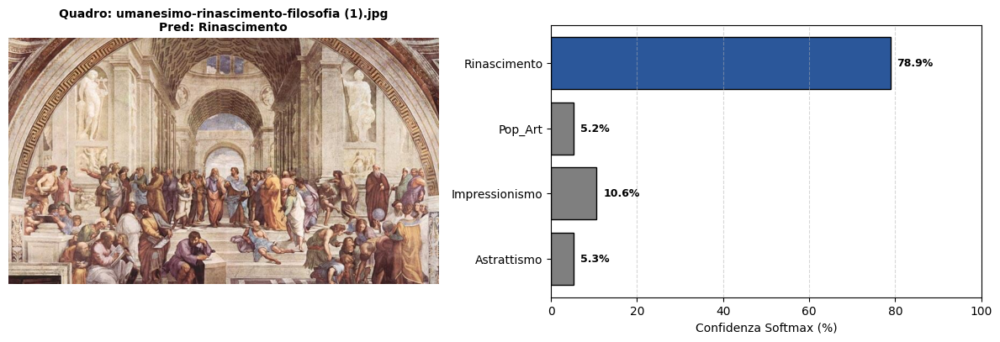


════════════════════════════════════════════════════════════
 MENU DI CONTROLLO AI ARTE - SCEGLI COSA FARE
════════════════════════════════════════════════════════════
 [1] MODALITÀ GENERAZIONE ARTISTICA (Algoritmo PSO Swarm + Diffusion)
 [2] MODALITÀ CLASSIFICAZIONE STILE (Rete ResNet50 Addestrata)
 [3] ESCI DAL PROGRAMMA
════════════════════════════════════════════════════════════


In [ ]:
# =====================================================================
# 4. INTERFACCIA DI SCELTA INTERATTIVA (MENU PRINCIPALE)
# =====================================================================
while True:
    print("\n" + "═"*60)
    print(" MENU DI CONTROLLO AI ARTE - SCEGLI COSA FARE")
    print("═"*60)
    print(" [1] MODALITÀ GENERAZIONE ARTISTICA (Algoritmo PSO Swarm + Diffusion)")
    print(" [2] MODALITÀ CLASSIFICAZIONE STILE (Rete ResNet50 Addestrata)")
    print(" [3] ESCI DAL PROGRAMMA")
    print("═"*60)

    scelta = input("Digita il numero dell'opzione desiderata (1, 2 o 3): ").strip()

    if scelta == "1":
        esegui_pittura_pso()
    elif scelta == "2":
        esegui_classificazione_resnet()
    elif scelta == "3":
        print("\nLetto il comando di uscita. Programma terminato. Buona sperimentazione artistica!")
        break
    else:
        print("Scelta non valida! Digita solo 1, 2 o 3.")